# Q3 Image Segmentation

## Q3.1 Downloading data and visualization

#### Importing necessary libraries

In [256]:
# importing the required libraries
import os
import torch
import pandas as pd
import numpy as np
from PIL import Image as im
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import utils
from torchvision.transforms import v2 as transforms
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score, precision_score, recall_score
import network 
import tqdm
import torchvision
from tabulate import tabulate

# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

In [257]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


#### Level3ID labels to required format mapping

In [258]:
label_mapping = {
    0 : ['road', (128, 64, 128), 0], 
    2 : ['sidewalk', (244, 35, 232), 1],
    4 : ['person', (220, 20, 60), 11],
    5 : ['rider', (255, 0, 0), 12],
    6 : ['motorcycle', (0, 0, 230), 17],
    7 : ['bicycle', (119, 11, 32), 18],
    9 : ['car', (0, 0, 142), 13],
    10 : ['truck', (0, 0, 70), 14],
    11 : ['bus', (0, 60, 100), 15], 
    12 : ['train', (0, 80, 100), 16], 
    14 : ['wall', (102, 102, 156), 3],
    15 : ['fence', (190, 153, 153), 4],
    18 : ['traffic sign', (220, 220, 0), 7],
    19 : ['traffic light', (250, 170, 30), 6],
    20 : ['pole', (153, 153, 153), 5],
    22 : ['building', (70, 70, 70), 2],
    24 : ['vegetation', (107, 142, 35), 8],
    25 : ['sky', (70, 130, 180), 10]
}
reverse_label_mapping = {}
for key, value in label_mapping.items():
    reverse_label_mapping[value[2]] = [value[0], value[1], key]

#### Dataset class

In [259]:
transform1 = transforms.Compose([
    transforms.Resize((512, 512), interpolation=torchvision.transforms.InterpolationMode.NEAREST), 
    transforms.ToTensor()
])

In [260]:
class IndianDrivingDataset(Dataset):
    def __init__(self, image_dir, mask_dir, image_transform, mask_transform):
        self.image_transform = image_transform
        self.mask_transform = mask_transform
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.classes = [label_mapping[i][0] for i in label_mapping]
        self.label_mapping = label_mapping
        self.num_classes = len(self.classes)
        self.__load_data__()

    def __load_data__(self):
        self.image_filenames = []
        self.mask_filenames = []
        for file in os.listdir(self.image_dir):
            index = int(file.split('.')[0].split('_')[1])
            self.image_filenames.append(self.image_dir + file)
            self.mask_filenames.append(self.mask_dir + 'mask_' + str(index) + '.jpg')
    
    def __len__(self):
        return len(os.listdir(self.image_dir))
    
    def __getitem__(self, idx):
        image = im.open(self.image_filenames[idx])
        mask = im.open(self.mask_filenames[idx])
        # mask = np.array(mask)
        if self.image_transform:
            image = self.image_transform(image)
        if self.mask_transform:
            mask = self.mask_transform(mask)
        # image = image.to(device)
        # mask = mask.to(device)
        sample = {'image': image, 'mask': mask, 'index': idx}
        return sample

#### Dataset and Dataloader

In [261]:
idd_dataset = IndianDrivingDataset('images/image_archive/', 'masks/mask_archive/', transform1, transform1)
train_size = int(0.7 * len(idd_dataset)) + 1
test_size = len(idd_dataset) - train_size
train_dataset, test_dataset = random_split(idd_dataset, [train_size, test_size])
# transfer one image from test dataset to train dataset
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=2, shuffle=True)

#### Data Visualization

In [262]:
# visualizing the data
def data_visualization(dataloader):
    num = 4
    for i in range(num):
        sample = next(iter(dataloader))
        image, mask = sample['image'], sample['mask']
        image, mask = image.to('cpu'), mask.to('cpu')
        image, mask = np.array(image), np.array(mask)[0][0]
        mask = (mask * 255).astype(np.uint8)
        new_image = image[0].transpose((1, 2, 0))
        new_image.fill(0)
        for key in label_mapping:
            new_image[mask == key] = list(label_mapping[key][1])
        new_image = new_image.astype(np.uint8)
        image = np.array(sample['image'].to('cpu'))[0].transpose((1, 2, 0))
        # plotting the images and the masks 
        plt.figure(figsize=(20, 20))
        plt.subplot(num, 2, 2 * i + 1)
        plt.imshow(image)
        plt.title('Original Image')
        plt.subplot(num, 2, 2 * i + 2)
        plt.imshow(new_image)
        plt.title('Ground Truth Mask')
        plt.show()

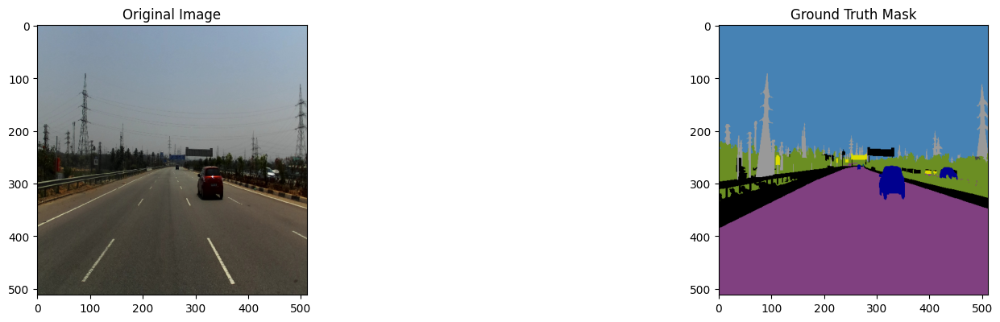

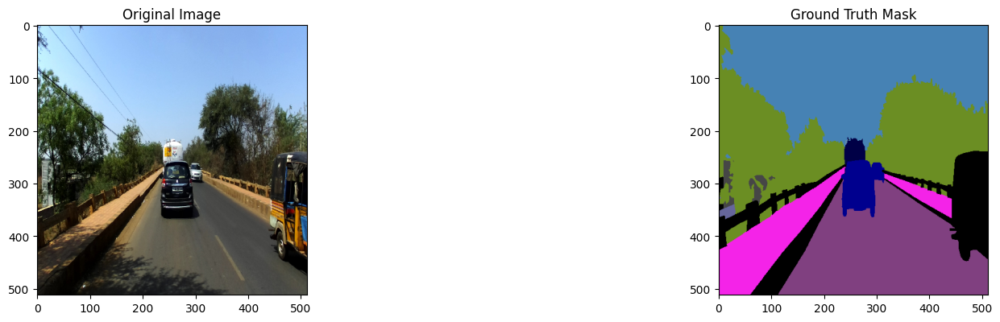

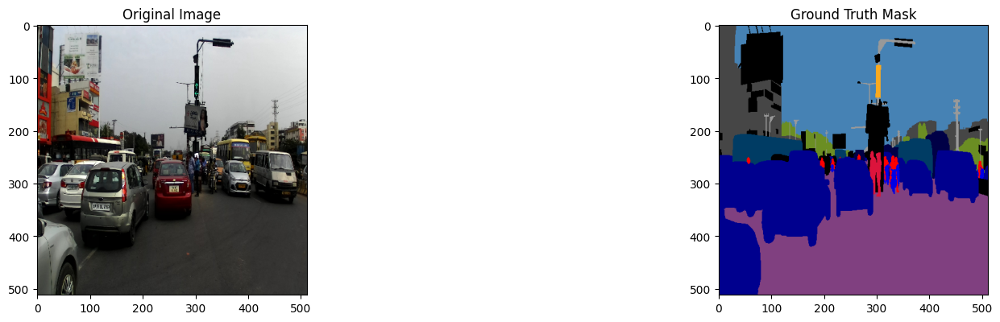

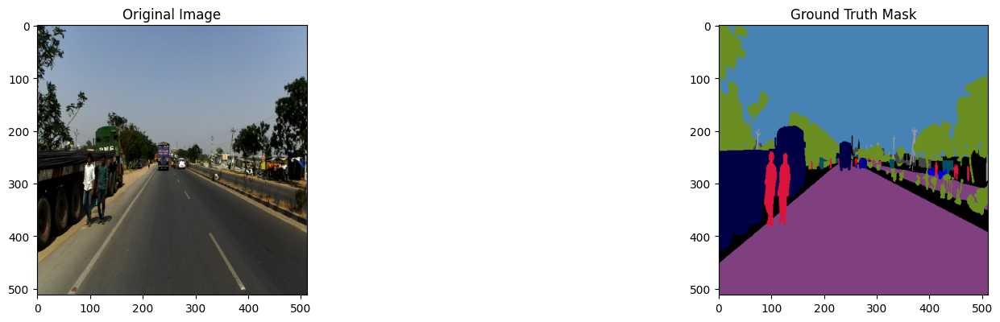

In [263]:
data_visualization(train_loader)

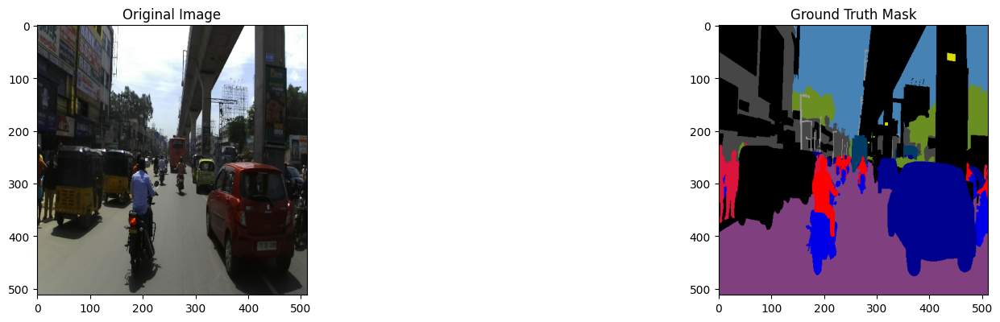

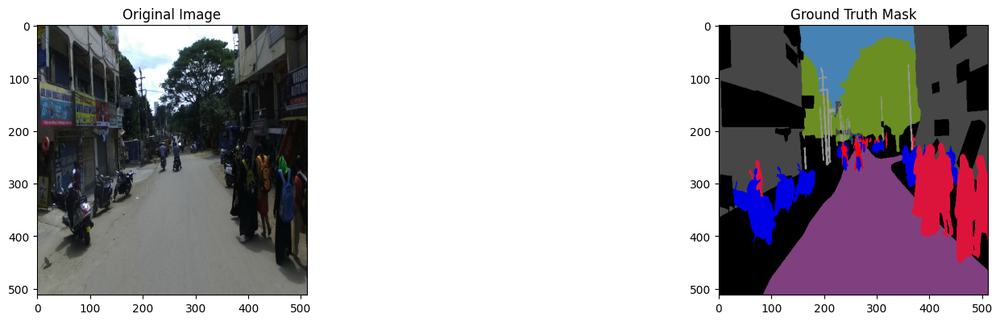

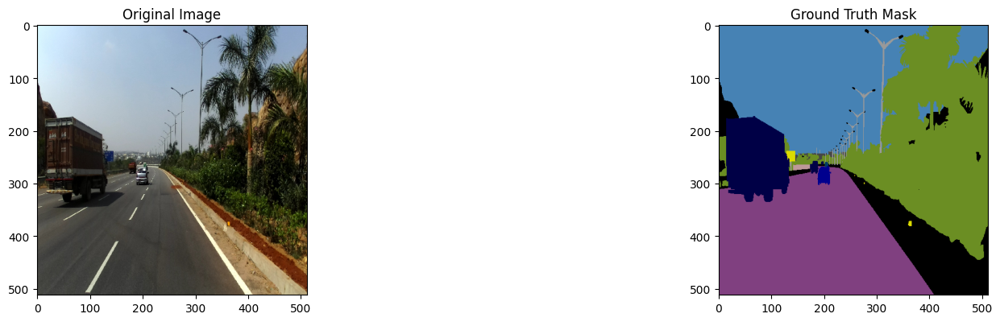

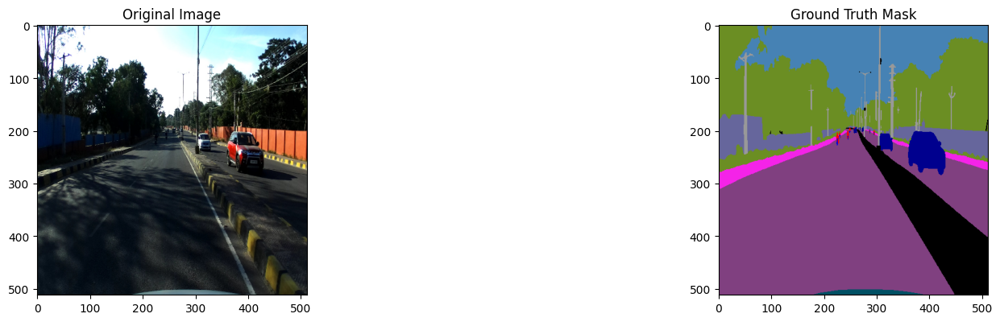

In [264]:
data_visualization(test_loader)

#### Class Distribution Analysis

In [265]:
# counting the number of instances of each class in all the pixels of the masks
def data_distribution_analysis(dataloader):
    # making a dictionary to store the counts of each class
    class_counts = {}
    for i in label_mapping.keys():
        class_counts[label_mapping[i][0]] = 0
    # iterating over the dataset
    for i, sample in enumerate(tqdm.tqdm(dataloader)):
        mask = np.array(sample['mask'].to('cpu'))[0][0]
        mask = mask * 255
        mask = mask.astype(np.uint8)
        for i in label_mapping.keys():
            class_counts[label_mapping[i][0]] += np.sum(mask == i)
    return class_counts

In [266]:
def plot_class_distribution(class_counts):
    class_names = list(class_counts.keys())
    class_values = list(class_counts.values())
    plt.figure(figsize=(20, 10))
    plt.bar(class_names, class_values)
    plt.title('Class Distribution')
    plt.show()

100%|██████████| 1048/1048 [01:09<00:00, 15.16it/s]


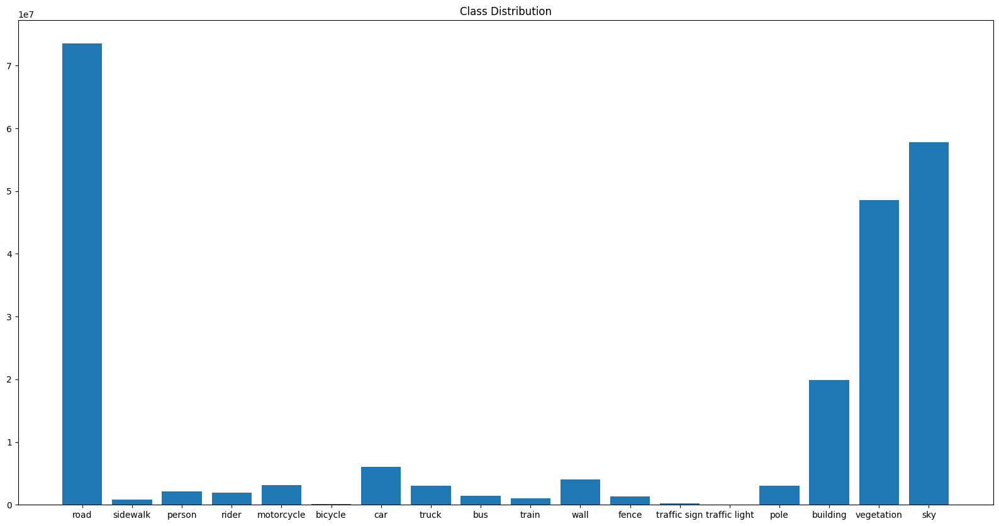

In [70]:
test_distribution = data_distribution_analysis(test_loader)
plot_class_distribution(test_distribution)

100%|██████████| 1222/1222 [02:34<00:00,  7.89it/s]


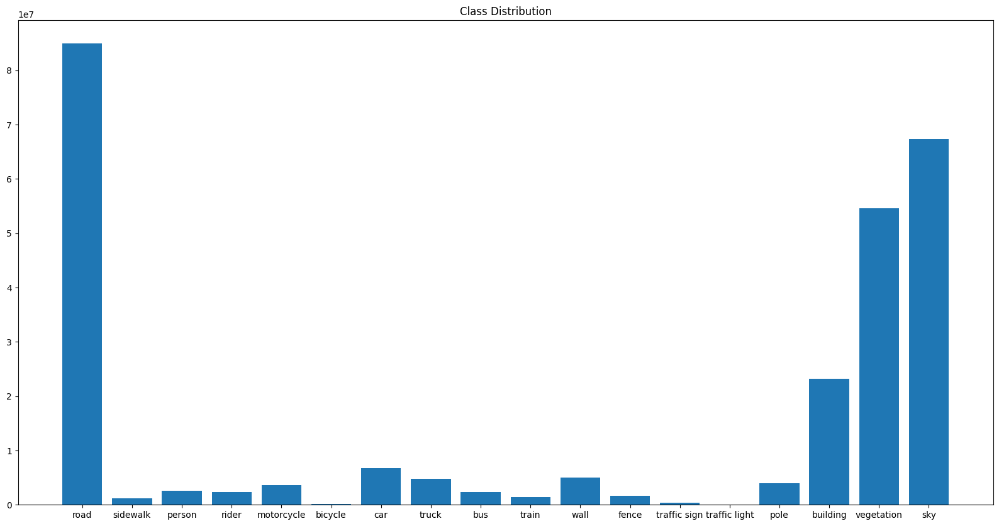

In [72]:
train_distibution = data_distribution_analysis(train_loader)
plot_class_distribution(train_distibution)

## Q3.2 Evaluating a segmentation model

#### Loading pre-trained model

In [267]:
MODEL_NAME = 'deeplabv3plus_mobilenet'
NUM_CLASSES = 19
OUTPUT_STRIDE = 16
PATH_TO_PTH = 'deeplabv3plus_mobilenet_cityscapes_os16.pth'

In [268]:
model = network.modeling.__dict__[MODEL_NAME](num_classes=NUM_CLASSES, output_stride=OUTPUT_STRIDE)
model.load_state_dict(torch.load(PATH_TO_PTH)['model_state'])

<All keys matched successfully>

#### Inference visualization

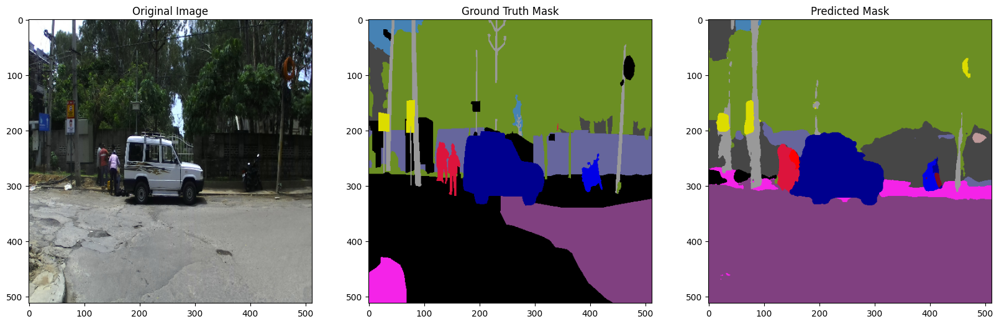

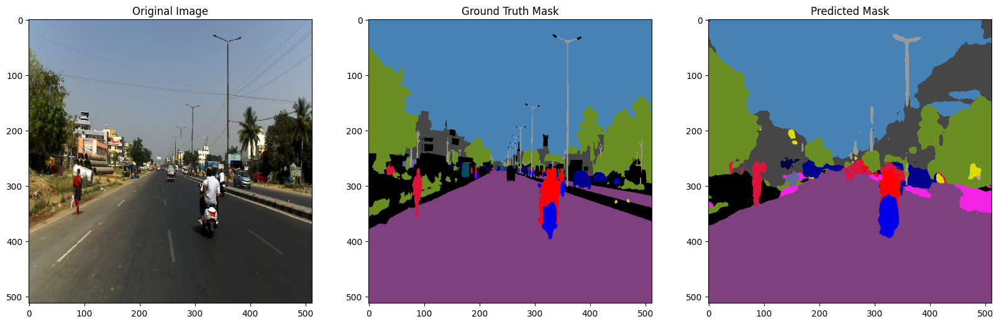

In [269]:
count = 0
for i, sample in enumerate(test_loader):
    image, mask = sample['image'], sample['mask']
    # image = image.to('cpu')
    # mask = mask.to('cpu')
    with torch.no_grad():
        for idx in range(image.shape[0]):
            curr_image = np.array(image[idx]).transpose((1, 2, 0))
            curr_mask = np.array(mask[idx]*255).astype(np.uint8)[0]
            curr_image_plt = curr_image.copy()
            coloured_image = curr_image
            for key in label_mapping:
                coloured_image[curr_mask == key] = list(label_mapping[key][1])
            coloured_image = coloured_image.astype(np.uint8)
            curr_output = model(image)
            curr_output = curr_output.max(1)[1].to('cpu').numpy()
            gen_mask = curr_output[idx]
            gen_mask = np.array(gen_mask)
            img_copy = image
            img_copy = np.array(img_copy)
            img_copy = img_copy[0].transpose((1, 2, 0))
            for key in reverse_label_mapping: 
                img_copy[gen_mask == key] = reverse_label_mapping[key][1]
            img_copy = img_copy.astype(np.uint8)
            # plottting the original image, ground truth mask and the predicted mask
            if (count<=3):
                fig, ax = plt.subplots(1, 3, figsize=(20, 20))
                ax[0].imshow(curr_image_plt)
                ax[0].set_title('Original Image')
                ax[1].imshow(coloured_image)
                ax[1].set_title('Ground Truth Mask')
                ax[2].imshow(img_copy)
                ax[2].set_title('Predicted Mask')
                plt.show()
            count+=1
        break

#### Inference on test data

In [270]:
def inference(model, dataloader):
    with torch.no_grad():
        count = 0
        for i, sample in enumerate(tqdm.tqdm(dataloader)):
            images, masks = sample['image'], sample['mask']
            outputs = model(images.to('cpu'))
            for j in range(images.shape[0]):
                pred = (torch.argmax(outputs, dim = 1)).numpy()[j]
                mask = ((masks.numpy()[j].squeeze(0))*255).astype(np.uint8)
                # mapping the mask to cityscape class mapping
                new_mask = mask.copy()
                new_mask.fill(9)
                for key in label_mapping:
                    new_mask[key == mask] = label_mapping[key][2]
                mask = new_mask
                pred = pred.astype(np.uint8)
                mask_image = im.fromarray(mask)
                mask_image.save('labels/label_' + str(count) + '.png')
                pred_image = im.fromarray(pred)
                pred_image.save('predictions/pred_' + str(count) + '.png')
                count += 1

In [153]:
inference(model, test_loader)

100%|██████████| 1047/1047 [34:10<00:00,  1.96s/it]


#### Evaluation

In [271]:
# iou, precision, recall, dice coefficient, accuracy
def metric_calc():
    class_wise_metrics = {}
    # storing the metrics for each class - IoU, Precision, Recall, Dice Coefficient, Accuracy
    for key in reverse_label_mapping:
        class_wise_metrics[reverse_label_mapping[key][0]] = [0, 0, 0, 0, 0]
    # calculating the metrics
    for file in tqdm.tqdm(os.listdir(os.path.join(os.getcwd(), 'predictions'))):
        idx = int(file.split('_')[1].split('.')[0])
        pred_file = os.path.join(os.getcwd(), 'predictions', file)
        label_file = os.path.join(os.getcwd(), 'labels', 'label_' + str(idx) + '.png')
        pred = np.array(im.open(pred_file))
        label = np.array(im.open(label_file))
        # iterate over each class
        for key in reverse_label_mapping:
            class_name = reverse_label_mapping[key][0]
            true_positive = np.sum((pred == key) & (label == key))
            false_positive = np.sum((pred == key) & (label != key))
            false_negative = np.sum((pred != key) & (label == key))
            true_negative = np.sum((pred != key) & (label != key))
            # calculating the metrics
            iou = true_positive / (true_positive + false_positive + false_negative + 1e-5)
            precision = true_positive / (true_positive + false_positive + 1e-5)
            recall = true_positive / (true_positive + false_negative + 1e-5)
            dice_coefficient = (2 * true_positive) / (2 * true_positive + false_positive + false_negative + 1e-5)
            accuracy = (true_positive + true_negative) / (true_positive + true_negative + false_positive + false_negative + 1e-5)
            class_wise_metrics[class_name][0] += iou
            class_wise_metrics[class_name][1] += precision
            class_wise_metrics[class_name][2] += recall
            class_wise_metrics[class_name][3] += dice_coefficient
            class_wise_metrics[class_name][4] += accuracy
    num_files = len(os.listdir(os.path.join(os.getcwd(), 'predictions')))
    # averaging the metrics
    for key in class_wise_metrics:
        class_wise_metrics[key] = [i / num_files for i in class_wise_metrics[key]]
        class_wise_metrics[key] = [round(i*100, 4) if i == 4 else round(i, 2) for i in class_wise_metrics[key]]
    return class_wise_metrics

In [272]:
class_wise_metrics = metric_calc()

  0%|          | 0/2094 [00:00<?, ?it/s]

100%|██████████| 2094/2094 [00:55<00:00, 38.00it/s]


In [273]:
# printing the metrics as a table
def print_metrics_table(class_wise_metrics):
    sorted_classes = sorted(class_wise_metrics, key=lambda x: class_wise_metrics[x][0], reverse=True)
    table = []
    for class_name in sorted_classes:
        table.append([class_name] + class_wise_metrics[class_name])
    print(tabulate(table, headers=['Class Name', 'IoU', 'Precision', 'Recall', 'Dice Coefficient', 'Accuracy'], tablefmt='outline'))

In [274]:
print_metrics_table(class_wise_metrics)

+---------------+-------+-------------+----------+--------------------+------------+
| Class Name    |   IoU |   Precision |   Recall |   Dice Coefficient |   Accuracy |
+===============+=======+=============+==========+====================+============+
| road          |  0.72 |        0.74 |     0.95 |               0.82 |       0.9  |
| vegetation    |  0.6  |        0.67 |     0.85 |               0.72 |       0.93 |
| sky           |  0.54 |        0.95 |     0.54 |               0.65 |       0.9  |
| car           |  0.28 |        0.3  |     0.58 |               0.35 |       0.97 |
| building      |  0.24 |        0.27 |     0.56 |               0.33 |       0.86 |
| pole          |  0.15 |        0.26 |     0.28 |               0.23 |       0.98 |
| rider         |  0.11 |        0.26 |     0.15 |               0.16 |       0.99 |
| person        |  0.1  |        0.16 |     0.17 |               0.14 |       0.99 |
| motorcycle    |  0.09 |        0.31 |     0.12 |               

In [275]:
def class_wise_IoU(pred, label, key):
    true_positive = np.sum((pred == key) & (label == key))
    false_positive = np.sum((pred == key) & (label != key))
    false_negative = np.sum((pred != key) & (label == key))
    iou = true_positive / (true_positive + false_positive + false_negative + 1e-5)
    return iou

#### IoU Analaysis when threshold is 0.5

In [276]:
class_wise_images = {}

for key in reverse_label_mapping:
    class_wise_images[reverse_label_mapping[key][0]] = []

for file in os.listdir(os.path.join(os.getcwd(), 'predictions')):
    idx = int(file.split('_')[1].split('.')[0])
    pred_file = os.path.join(os.getcwd(), 'predictions', file)
    label_file = os.path.join(os.getcwd(), 'labels', 'label_' + str(idx) + '.png')
    pred = np.array(im.open(pred_file))
    label = np.array(im.open(label_file))
    # compute IoU for each class
    for key in reverse_label_mapping:
        class_name = reverse_label_mapping[key][0]
        IoU = class_wise_IoU(pred, label, key)
        if (IoU <= 0.5 and len(class_wise_images[class_name]) < 3):
            class_wise_images[class_name].append((pred, label))
    if all(len(class_wise_images[class_name]) >= 3 for class_name in class_wise_images):
        break

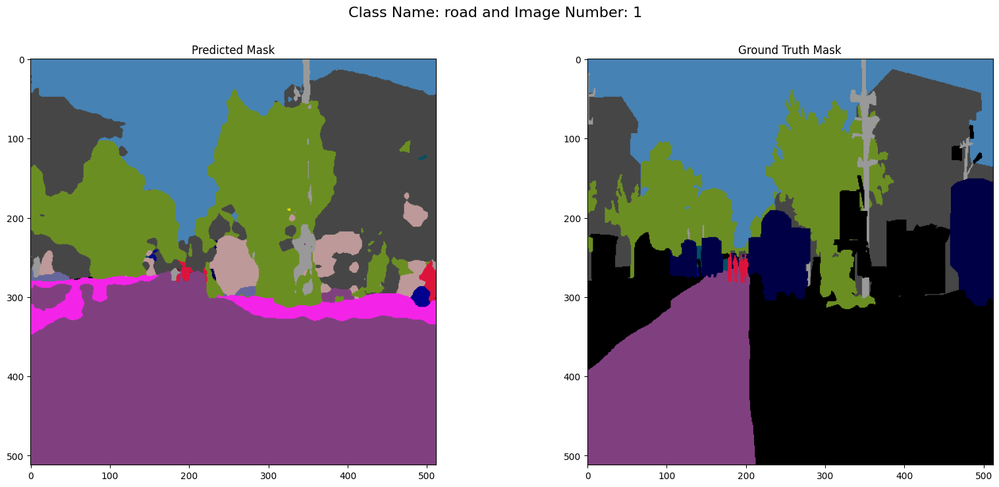

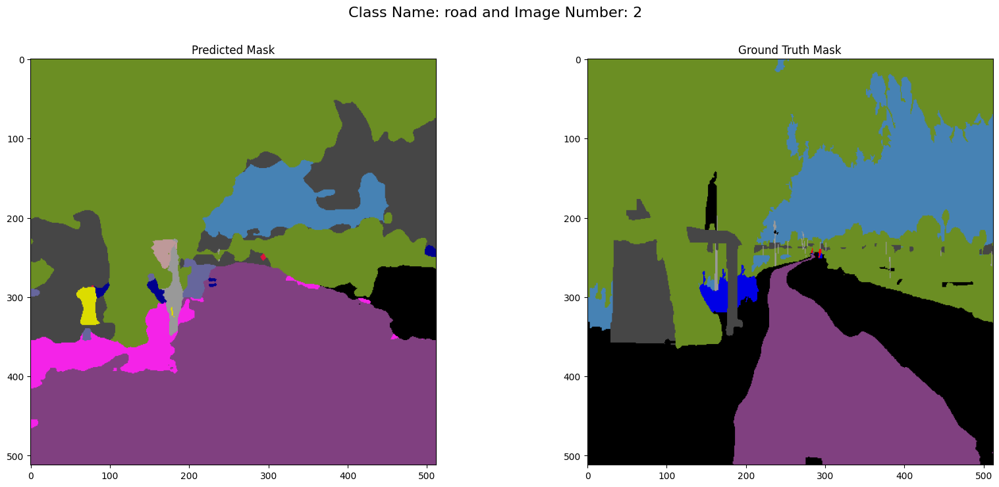

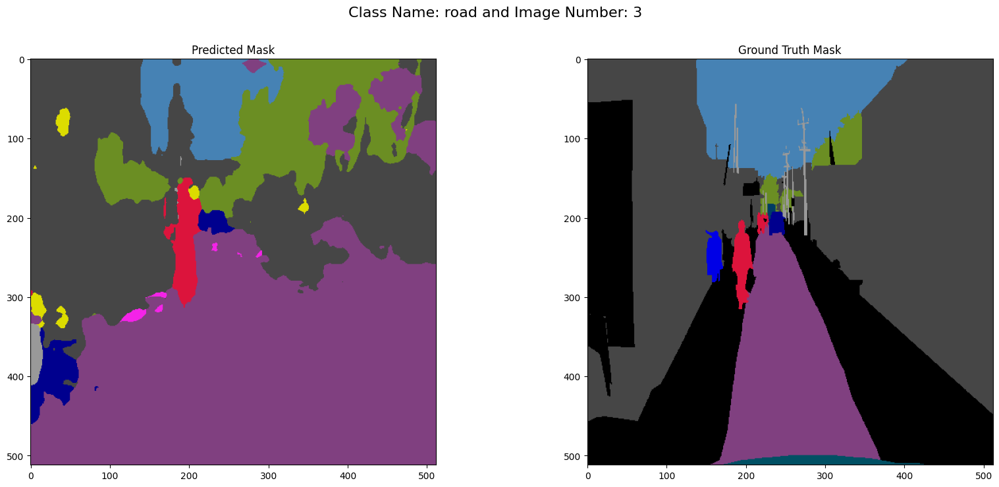

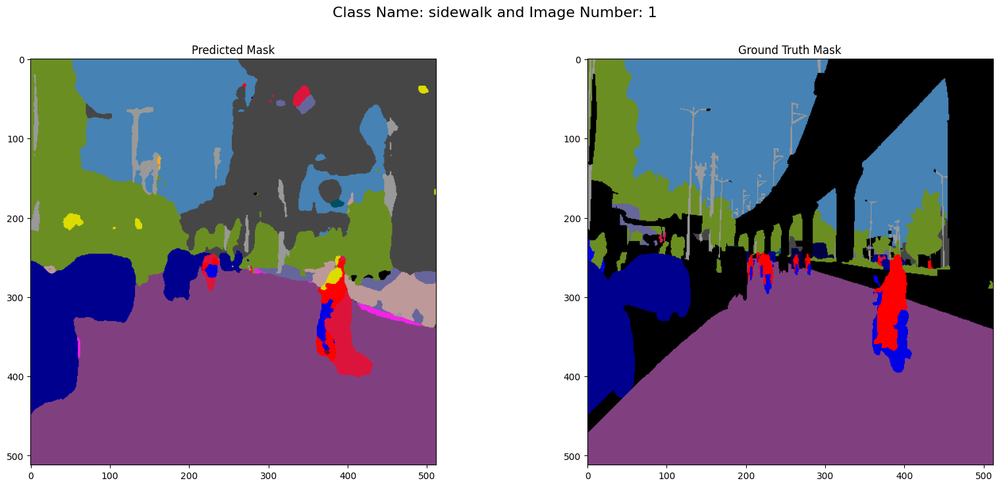

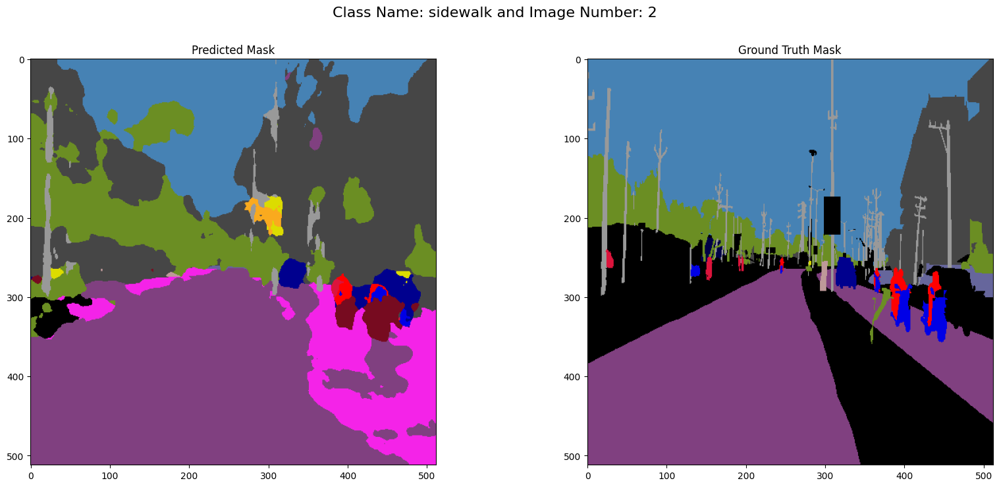

...

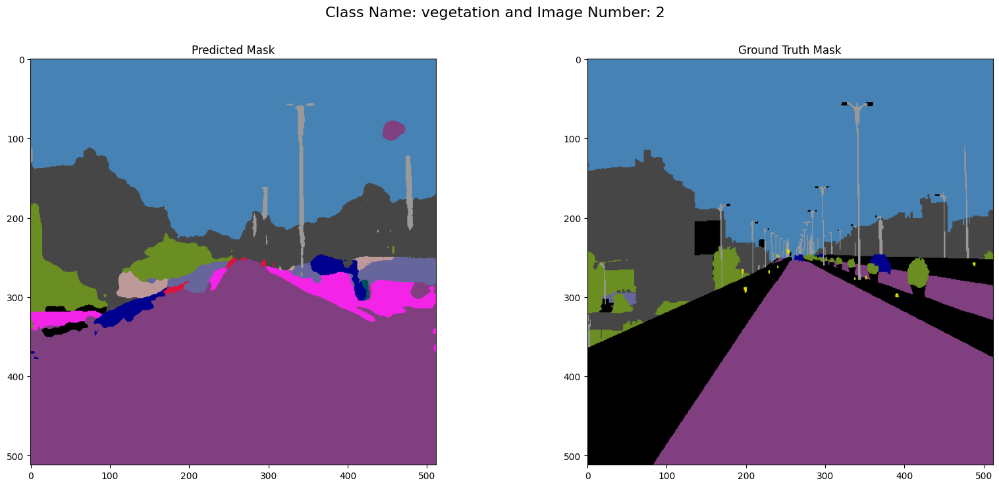

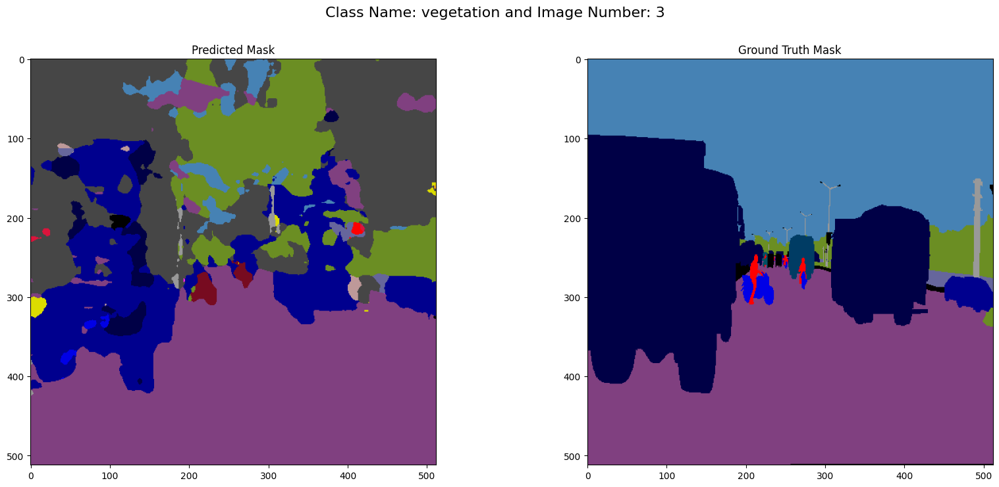

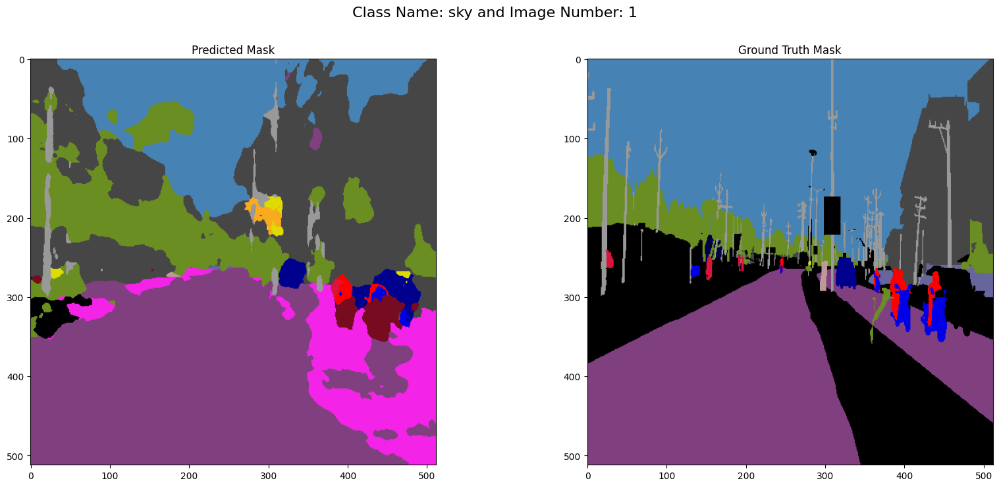

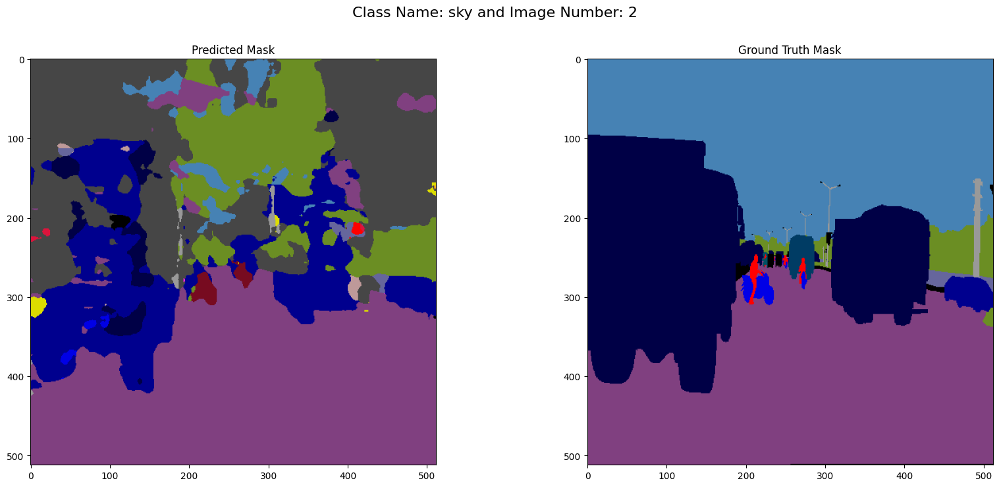

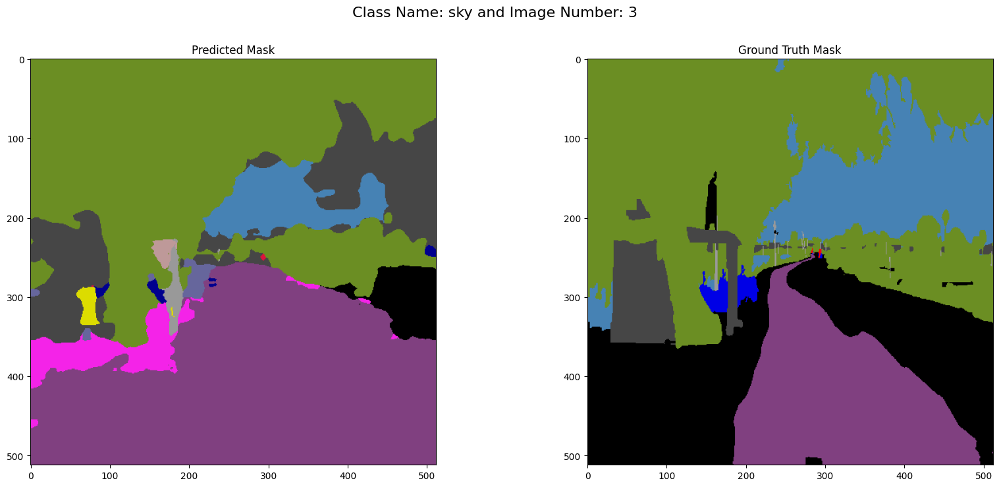

In [277]:
for class_name in class_wise_images:
    for i in range(len(class_wise_images[class_name])):
        pred, label = class_wise_images[class_name][i]
        pred_image = np.zeros((pred.shape[0], pred.shape[1], 3), dtype=np.uint8)
        label_image = np.zeros((label.shape[0], label.shape[1], 3), dtype=np.uint8)
        for key in reverse_label_mapping:
            pred_image[pred == key] = reverse_label_mapping[key][1]
            label_image[label == key] = reverse_label_mapping[key][1]
        fig, ax = plt.subplots(1, 2, figsize=(20, 8))
        ax[0].imshow(pred_image)
        ax[0].set_title('Predicted Mask')
        ax[1].imshow(label_image)
        ax[1].set_title('Ground Truth Mask')
        plt.suptitle('Class Name: ' + class_name + ' and Image Number: ' + str(i+1), fontsize=16)
        plt.show()

## Q3.3 Analysis of Results

#### Confusion Matrix

In [278]:
# confusion matrix 
def generate_confusion_matrix():
    confusion_matrix = np.zeros((len(label_mapping)+1, len(label_mapping)+1))
    for file in tqdm.tqdm(os.listdir(os.path.join(os.getcwd(), 'predictions'))):
        idx = int(file.split('_')[1].split('.')[0])
        pred_file = os.path.join(os.getcwd(), 'predictions', file)
        label_file = os.path.join(os.getcwd(), 'labels', 'label_' + str(idx) + '.png')
        pred = np.array(im.open(pred_file))
        label = np.array(im.open(label_file))
        for i in range(pred.shape[0]):
            for j in range(pred.shape[1]):
                confusion_matrix[pred[i][j]][label[i][j]] += 1
    return confusion_matrix

In [279]:
# plotting the confusion matrix
def plot_confusion_matrix(confusion_matrix):
    confusion_matrix = np.round(confusion_matrix, 2)
    fig, ax = plt.subplots(figsize=(20, 20))
    axis_labels = list(reverse_label_mapping.values())
    axis_labels = [i[0] for i in axis_labels]
    axis_labels.insert(8, 'unlabeled')
    # display the confusion matrix as a heatmap with decimal values
    im = ax.imshow(confusion_matrix, cmap='Blues')
    # setting the title
    plt.title('Confusion Matrix')
    # setting the labels for the axes as the class names
    ax.set_xticks(np.arange(len(axis_labels)))
    ax.set_yticks(np.arange(len(axis_labels)))
    ax.set_xticklabels(axis_labels, fontsize=10)
    ax.set_yticklabels(axis_labels, fontsize=10)
    # rotating the tick labels for better visibility
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    # creating the text annotations
    for i in range(len(reverse_label_mapping)+1):
        for j in range(len(reverse_label_mapping)+1):
            text = ax.text(j, i, confusion_matrix[i, j], ha="center", va="center", color="black")
    # displaying the heatmap
    fig.tight_layout()
    plt.show()

In [280]:
confusion_matrix = generate_confusion_matrix()

100%|██████████| 2094/2094 [10:10<00:00,  3.43it/s]


In [281]:
confusion_matrix = confusion_matrix.astype(float)
confusion_matrix_ = confusion_matrix.copy()
row_sums = confusion_matrix_.sum(axis=1)
confusion_matrix_ = confusion_matrix_ / row_sums[:, np.newaxis]

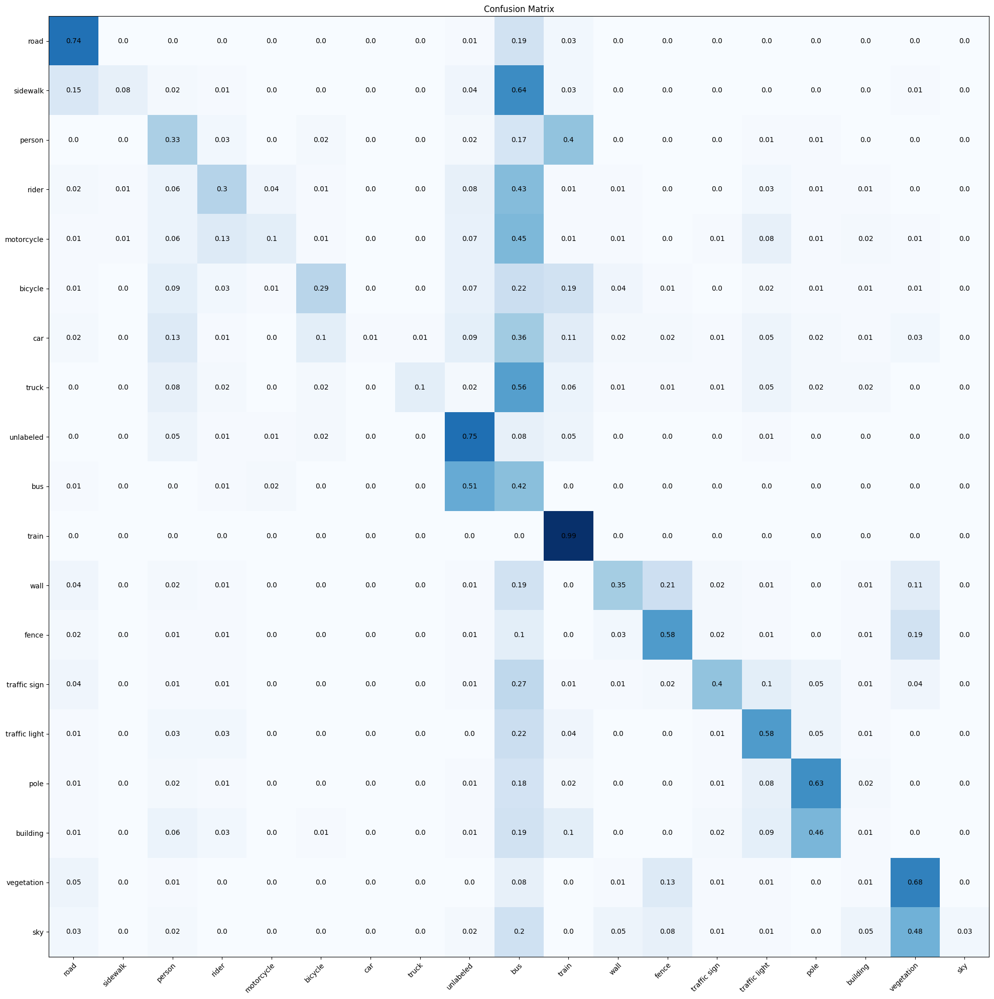

In [282]:
plot_confusion_matrix(confusion_matrix_)

## Q3.4 CityScape Validation Dataset Evaulation

#### Dataset Creation and Setup

In [283]:
transform1 = transforms.Compose([
    transforms.Resize((512, 512), interpolation=torchvision.transforms.InterpolationMode.NEAREST), 
    transforms.ToTensor()
])

In [284]:
cityscape_id_trainid = {
    7 : 0, 
    8 : 1, 
    11 : 2, 
    12 : 3, 
    13 : 4, 
    17 : 5, 
    19 : 6,
    20 : 7, 
    21 : 8,
    23 : 10, 
    24 : 11, 
    25 : 12, 
    26 : 13, 
    27 : 14,
    28 : 15,
    31 : 16,
    32 : 17,
    33 : 18
}

In [285]:
class CityScapesDataset(Dataset):
    def __init__(self, image_dir, mask_dir, image_transform, mask_transform):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.image_transform = image_transform
        self.mask_transform = mask_transform
        self.classes = [reverse_label_mapping[i][0] for i in reverse_label_mapping]
        self.num_classes = len(self.classes)
        self.__load_data__()

    def __load_data__(self):
        self.image_filenames = []
        self.mask_filenames = []
        for file in os.listdir(self.image_dir):
            image_id = file.split('_leftImg8bit')[0]
            self.image_filenames.append(self.image_dir + file)
            self.mask_filenames.append(self.mask_dir + image_id + '_gtFine_labelIds.png')
        
    def __len__(self):  
        return len(os.listdir(self.image_dir))

    def __getitem__(self, idx):
        image = im.open(self.image_filenames[idx])
        mask = im.open(self.mask_filenames[idx])
        # mapping the cityscapes labels to the train ids
        mask = np.array(mask)
        new_mask = mask.copy()
        new_mask.fill(9)
        for key in cityscape_id_trainid:
            new_mask[mask == key] = cityscape_id_trainid[key]
        new_mask = im.fromarray(new_mask)
        if self.image_transform:
            image = self.image_transform(image)
        if self.mask_transform:
            new_mask = self.mask_transform(new_mask)
        sample = {'image': image, 'mask': new_mask}
        return sample

In [286]:
dataset = CityScapesDataset('cityscapes\\val\\image\\', 'cityscapes\\val\\mask\\', transform1, transform1)
val_loader = DataLoader(dataset, batch_size=2, shuffle=True)

#### Data Visualization

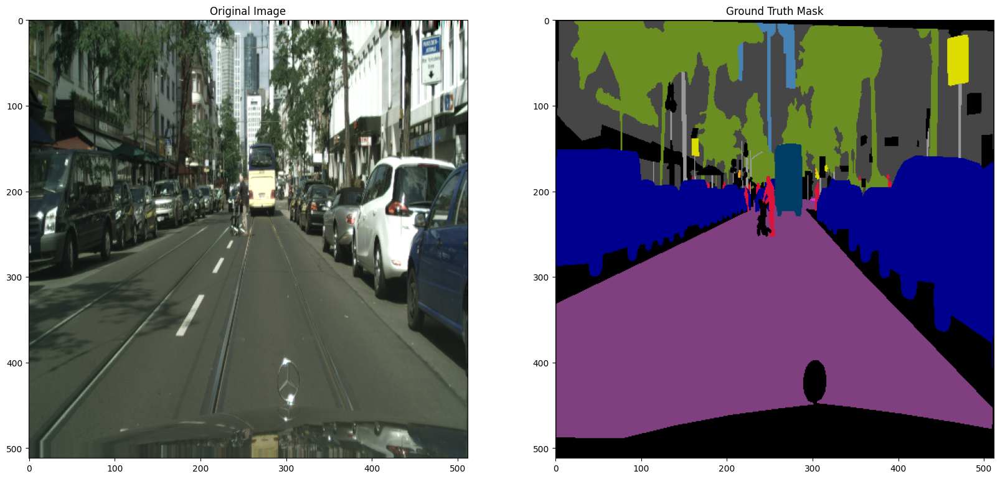

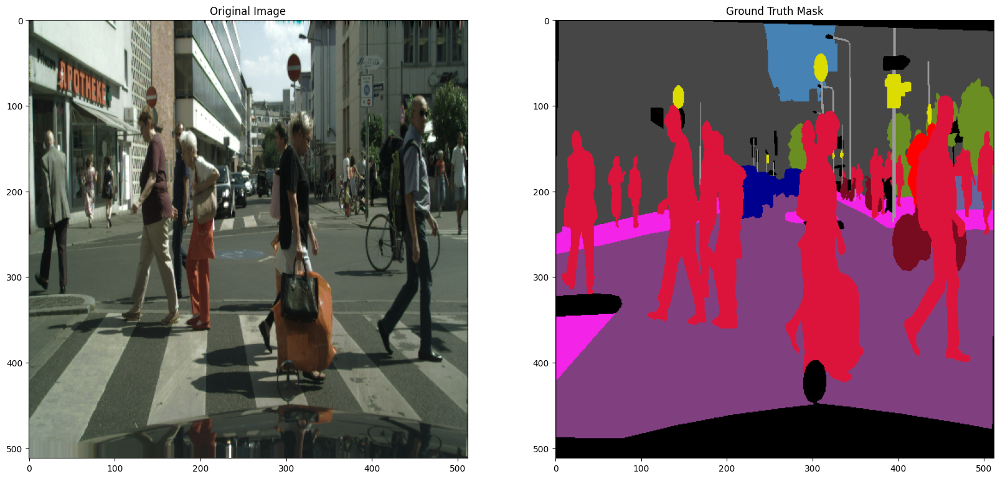

In [287]:
def cityscape_visualization(dataloader):
    for i, sample in enumerate(dataloader):
        images, masks = sample['image'], sample['mask']
        images, masks = images.to('cpu'), masks.to('cpu')
        for j in range(images.shape[0]):
            image = np.array(images[j]).transpose((1, 2, 0))
            mask = np.array(masks[j]).squeeze(0)
            mask = mask * 255
            mask = mask.astype(np.uint8)
            new_image = image.copy()
            for key in reverse_label_mapping:
                new_image[mask == key] = reverse_label_mapping[key][1]
            new_image = new_image.astype(np.uint8)
            fig, ax = plt.subplots(1, 2, figsize=(20, 20))
            ax[0].imshow(image)
            ax[0].set_title('Original Image')
            ax[1].imshow(new_image)
            ax[1].set_title('Ground Truth Mask')
            plt.show()
        break

cityscape_visualization(val_loader)

#### Loading pre-trained model

In [288]:
MODEL_NAME = 'deeplabv3plus_mobilenet'
NUM_CLASSES = 19
OUTPUT_STRIDE = 16
PATH_TO_PTH = 'deeplabv3plus_mobilenet_cityscapes_os16.pth'

In [289]:
model = network.modeling.__dict__[MODEL_NAME](num_classes=NUM_CLASSES, output_stride=OUTPUT_STRIDE)
model.load_state_dict(torch.load(PATH_TO_PTH)['model_state'])

<All keys matched successfully>

#### Inference Visualization

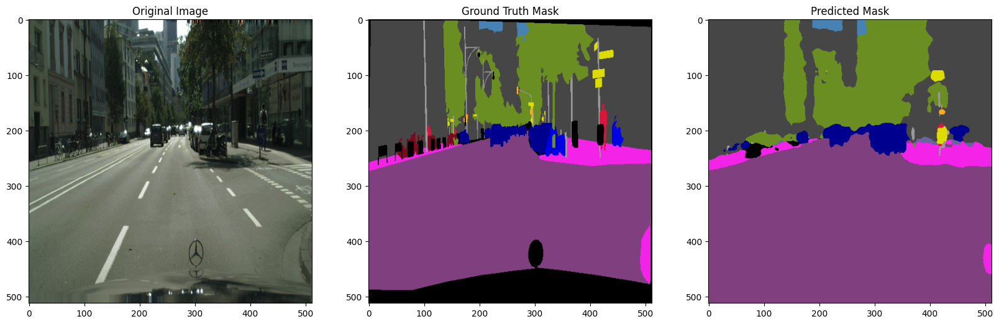

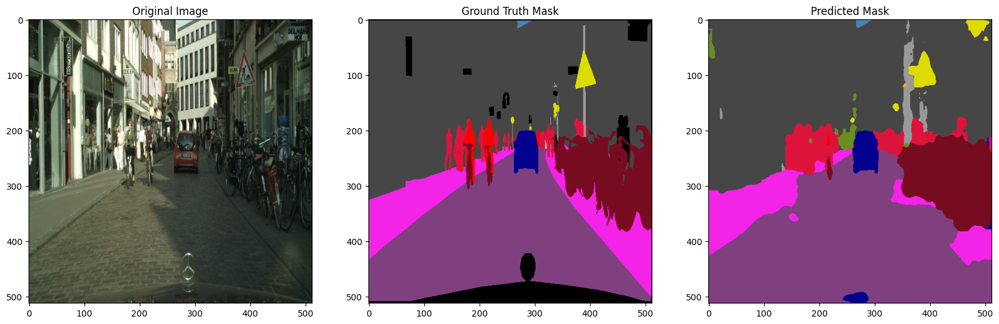

In [290]:
count = 0
for i, sample in enumerate(val_loader):
    images, masks = sample['image'], sample['mask']
    with torch.no_grad():
        for j in range(images.shape[0]):
            image = np.array(images[j]).transpose((1, 2, 0))
            mask = np.array(masks[j]).squeeze(0)
            mask = mask * 255
            mask = mask.astype(np.uint8)
            image_plt = image.copy()
            coloured_image = image
            for key in reverse_label_mapping:
                coloured_image[mask == key] = reverse_label_mapping[key][1]
            coloured_image = coloured_image.astype(np.uint8)
            output = model(images)
            output = output.max(1)[1].to('cpu').numpy()
            gen_mask = output[j]
            gen_mask = np.array(gen_mask)
            img_copy = images
            img_copy = np.array(img_copy)
            img_copy = img_copy[0].transpose((1, 2, 0))
            for key in reverse_label_mapping: 
                img_copy[gen_mask == key] = reverse_label_mapping[key][1]
            img_copy = img_copy.astype(np.uint8)
            # plotting the original image, ground truth mask and the predicted mask
            if (count<=3):
                fig, ax = plt.subplots(1, 3, figsize=(20, 20))
                ax[0].imshow(image_plt)
                ax[0].set_title('Original Image')
                ax[1].imshow(coloured_image)
                ax[1].set_title('Ground Truth Mask')
                ax[2].imshow(img_copy)
                ax[2].set_title('Predicted Mask')
                plt.show()
            count+=1
        break

In [291]:
def inference(model, dataloader):
    with torch.no_grad():
        count = 0
        for i, sample in enumerate(tqdm.tqdm(dataloader)):
            images, masks = sample['image'], sample['mask']
            outputs = model(images.to('cpu'))
            for j in range(images.shape[0]):
                pred = (torch.argmax(outputs, dim = 1)).numpy()[j]
                mask = ((masks.numpy()[j].squeeze(0))*255).astype(np.uint8)
                pred = pred.astype(np.uint8)
                mask_image = im.fromarray(mask)
                mask_image.save('cityscapes_labels/label_' + str(count) + '.png')
                pred_image = im.fromarray(pred)
                pred_image.save('cityscapes_predictions/pred_' + str(count) + '.png')
                count += 1

In [214]:
inference(model, val_loader)

100%|██████████| 250/250 [12:31<00:00,  3.01s/it]


#### Evaluation of Model

In [292]:
# iou, precision, recall, dice coefficient, accuracy
def metric_calc():
    class_wise_metrics = {}
    for key in reverse_label_mapping:
        class_wise_metrics[reverse_label_mapping[key][0]] = [0, 0, 0, 0, 0, 0]
    for file in tqdm.tqdm(os.listdir(os.path.join(os.getcwd(), 'cityscapes_predictions'))):
        idx = int(file.split('_')[1].split('.')[0])
        pred_file = os.path.join(os.getcwd(), 'cityscapes_predictions', file)
        label_file = os.path.join(os.getcwd(), 'cityscapes_labels', 'label_' + str(idx) + '.png')
        pred = np.array(im.open(pred_file))
        label = np.array(im.open(label_file))
        # iterating over each class
        for key in reverse_label_mapping:
            class_name = reverse_label_mapping[key][0]
            true_positive = np.sum((pred == key) & (label == key))
            false_positive = np.sum((pred == key) & (label != key))
            false_negative = np.sum((pred != key) & (label == key))
            true_negative = np.sum((pred != key) & (label != key))
            # calculating the metrics
            iou = true_positive / (true_positive + false_positive + false_negative + 1e-5)
            precision = true_positive / (true_positive + false_positive + 1e-5)
            recall = true_positive / (true_positive + false_negative + 1e-5)
            dice_coefficient = (2 * true_positive) / (2 * true_positive + false_positive + false_negative + 1e-5)
            accuracy = (true_positive + true_negative) / (true_positive + true_negative + false_positive + false_negative + 1e-5)
            f1_score = 2 * (precision * recall) / (precision + recall + 1e-5)
            class_wise_metrics[class_name][0] += iou
            class_wise_metrics[class_name][1] += precision
            class_wise_metrics[class_name][2] += recall
            class_wise_metrics[class_name][3] += dice_coefficient
            class_wise_metrics[class_name][4] += accuracy
            class_wise_metrics[class_name][5] += f1_score
    num_files = len(os.listdir(os.path.join(os.getcwd(), 'cityscapes_predictions')))
    for key in class_wise_metrics:
        class_wise_metrics[key] = [i / num_files for i in class_wise_metrics[key]]
        class_wise_metrics[key] = [round(i*100, 4) if i == 4 else round(i, 4) for i in class_wise_metrics[key]]
    return class_wise_metrics

In [293]:
class_wise_metrics = metric_calc()

100%|██████████| 500/500 [00:13<00:00, 38.00it/s]


In [294]:
def print_metrics_table(class_wise_metrics):
    sorted_classes = sorted(class_wise_metrics, key=lambda x: class_wise_metrics[x][0], reverse=True)
    table = []
    for class_name in sorted_classes:
        table.append([class_name] + class_wise_metrics[class_name])
    print(tabulate(table, headers=['Class Name', 'IoU', 'Precision', 'Recall', 'Dice Coefficient', 'Accuracy', 'F1 Score'], tablefmt='outline'))

In [295]:
print_metrics_table(class_wise_metrics)

+---------------+--------+-------------+----------+--------------------+------------+------------+
| Class Name    |    IoU |   Precision |   Recall |   Dice Coefficient |   Accuracy |   F1 Score |
+===============+========+=============+==========+====================+============+============+
| road          | 0.7422 |      0.7543 |   0.9455 |             0.8363 |     0.8906 |     0.8363 |
| vegetation    | 0.7032 |      0.7368 |   0.9099 |             0.8002 |     0.9603 |     0.8001 |
| building      | 0.6893 |      0.777  |   0.8238 |             0.7918 |     0.9477 |     0.7918 |
| car           | 0.6686 |      0.7414 |   0.7972 |             0.754  |     0.9885 |     0.754  |
| sky           | 0.5951 |      0.7254 |   0.6496 |             0.6647 |     0.9938 |     0.6647 |
| sidewalk      | 0.4885 |      0.6305 |   0.6254 |             0.6013 |     0.973  |     0.6013 |
| traffic sign  | 0.2695 |      0.4639 |   0.3567 |             0.3656 |     0.9952 |     0.3656 |
| person  

#### Confusion Matrix

In [296]:
# confusion matrix 
def generate_confusion_matrix():
    confusion_matrix = np.zeros((len(reverse_label_mapping)+1, len(reverse_label_mapping)+1))
    for file in tqdm.tqdm(os.listdir(os.path.join(os.getcwd(), 'cityscapes_predictions'))):
        idx = int(file.split('_')[1].split('.')[0])
        pred_file = os.path.join(os.getcwd(), 'cityscapes_predictions', file)
        label_file = os.path.join(os.getcwd(), 'cityscapes_labels', 'label_' + str(idx) + '.png')
        pred = np.array(im.open(pred_file))
        label = np.array(im.open(label_file))
        for i in range(pred.shape[0]):
            for j in range(pred.shape[1]):
                confusion_matrix[pred[i][j]][label[i][j]] += 1
    return confusion_matrix

In [297]:
# plotting the confusion matrix
def plot_confusion_matrix(confusion_matrix):
    confusion_matrix = np.round(confusion_matrix, 2)
    fig, ax = plt.subplots(figsize=(20, 20))
    axis_labels = list(reverse_label_mapping.values())
    axis_labels = [i[0] for i in axis_labels]
    axis_labels.insert(8, 'unlabeled')
    # display the confusion matrix as a heatmap with decimal values
    im = ax.imshow(confusion_matrix, cmap='Blues')
    # setting the title
    plt.title('Confusion Matrix')
    # setting the labels for the axes as the class names
    ax.set_xticks(np.arange(len(axis_labels)))
    ax.set_yticks(np.arange(len(axis_labels)))
    ax.set_xticklabels(axis_labels, fontsize=10)
    ax.set_yticklabels(axis_labels, fontsize=10)
    # rotating the tick labels for better visibility
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    # creating the text annotations
    for i in range(len(reverse_label_mapping)+1):
        for j in range(len(reverse_label_mapping)+1):
            text = ax.text(j, i, confusion_matrix[i, j], ha="center", va="center", color="black")
    # displaying the heatmap
    fig.tight_layout()
    plt.show()

In [298]:
confusion_matrix = generate_confusion_matrix()

100%|██████████| 500/500 [02:35<00:00,  3.22it/s]


In [299]:
confusion_matrix = confusion_matrix.astype(float)
confusion_matrix_ = confusion_matrix.copy()
row_sums = confusion_matrix_.sum(axis=1)
confusion_matrix_ = confusion_matrix_ / row_sums[:, np.newaxis]

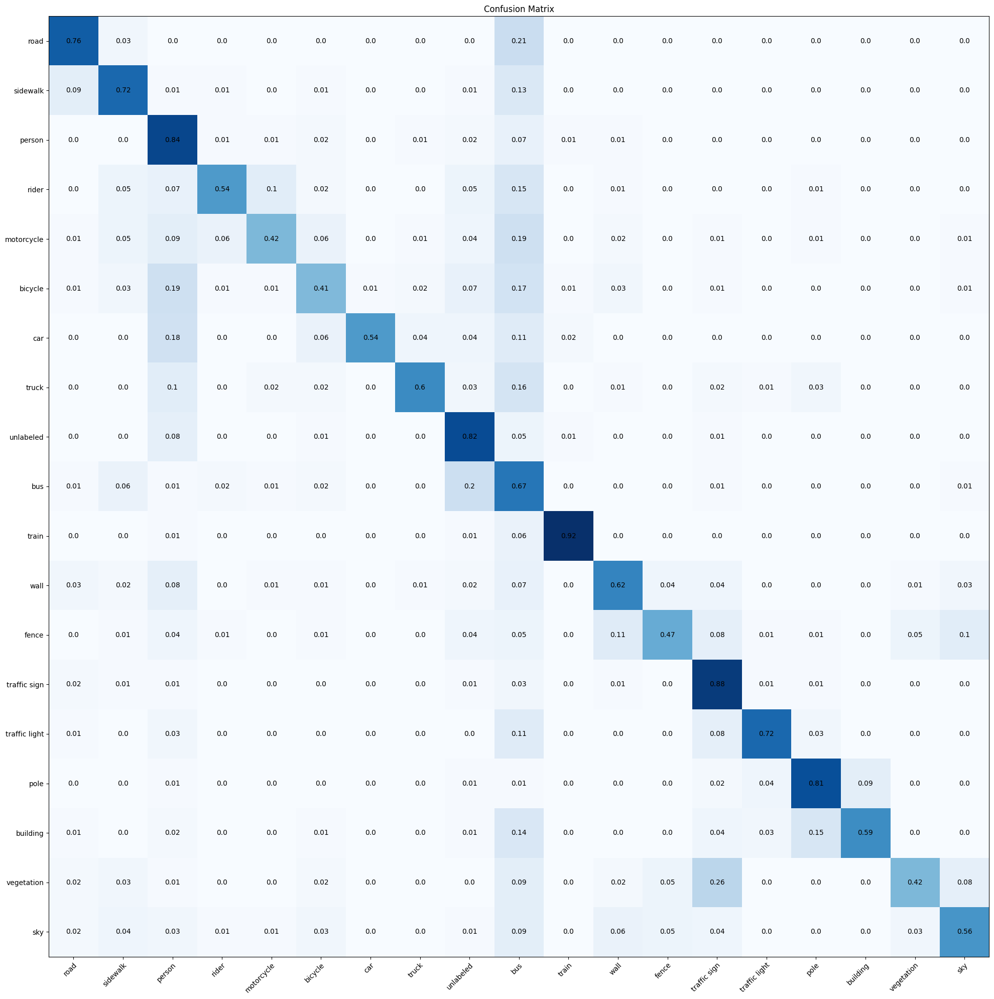

In [300]:
plot_confusion_matrix(confusion_matrix_)